In [3]:
################################# Import essential package #######################################
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
import glob
import cv2
import os 
import rdp
import math
import pandas

from PIL import Image
from PIL import ImageEnhance
from skimage import data, segmentation, feature, future
from skimage.filters import gaussian
from sklearn.cluster import DBSCAN
from sklearn.ensemble import RandomForestClassifier
from functools import partial
from skimage.util import random_noise

import scipy.ndimage as ndi
import plotly
import plotly.express as px
from skimage import (color, data, measure)

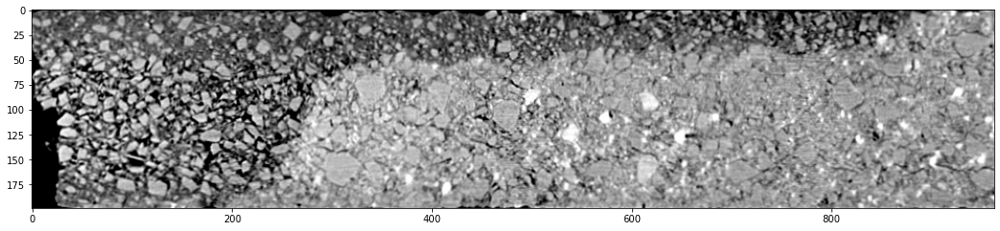

In [4]:
#################################### Import and show image ####################################
img = cv2.imread('image folder directory')
plt.figure(figsize=(18, 8))
plt.imshow(img, cmap='gray')
plt.show()

#################################### Input values ####################################
sigma_min = 1
sigma_max = 16
eps = 3
windowSize = 4
windowStep = 1
tolerance = 5
angle_coeff = 0.05

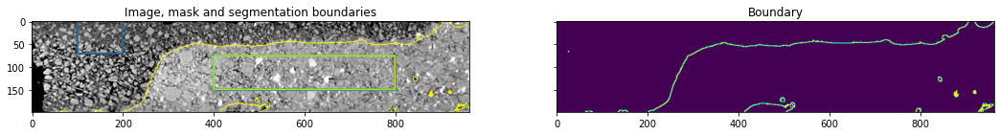

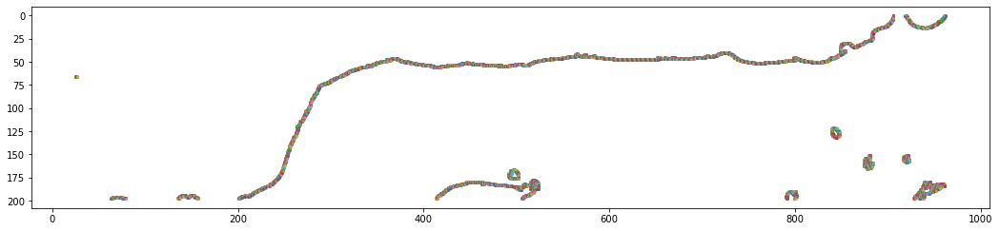

In [5]:
#################################### Step 1: Trainable segmentation ####################################
training_labels = np.zeros(img.shape[:2], dtype=np.uint8)
training_labels[:70, 100:200] = 1
training_labels[75:150, 400:800] = 2

sigma_min = sigma_min
sigma_max = sigma_max ### Higher value makes less clear boundary

clf = RandomForestClassifier(n_estimators=50, n_jobs=-1, bootstrap=True,
                             max_depth=10, max_samples=0.05)
features_func = partial(feature.multiscale_basic_features,
                        intensity=True, edges=False, texture=True,
                        sigma_min=sigma_min, sigma_max=sigma_max,
                        multichannel=True)
features = features_func(img)
clf = future.fit_segmenter(training_labels, features, clf)
result = future.predict_segmenter(features, clf)
a = segmentation.mark_boundaries(img, result, color=(1,1,0), mode='thick')
b = segmentation.find_boundaries(result, connectivity=100, mode='thick').astype(np.uint8)

fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(18, 8))
ax[0].imshow(a)
ax[0].contour(training_labels)
ax[0].set_title('Image, mask and segmentation boundaries')
ax[1].imshow(b)
ax[1].set_title('Segmentation')
ax[1].set_title('Boundary')

### Extract coordinates of pixel vector points
X=[]
for x in range(len(b[1])):
    for y in range(len(b)):
        if b[y][x] == 1:
            X.append([x,y])
X=np.array(X)

### Plot
plt.figure(figsize=(18, 8))
for x in range(len(X)):
    plt.plot(X[x][0],X[x][1],'.',markeredgewidth=0.0)     
plt.gca().invert_yaxis()          ### Reverse the y axis
plt.gca().set_aspect('equal', adjustable='box')          ### Equalize the x and y axes scale

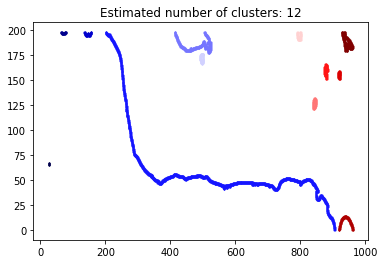

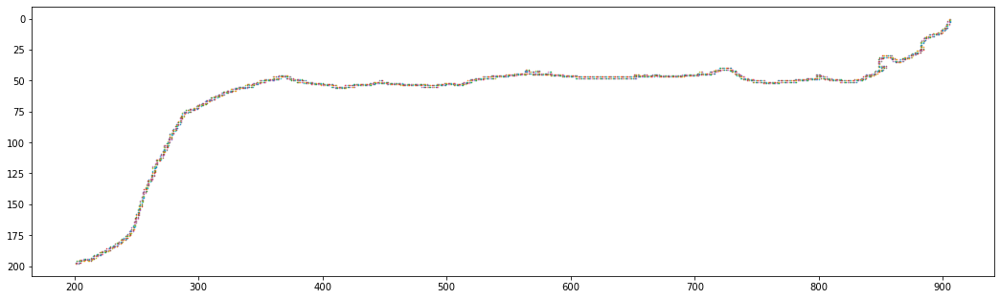

In [6]:
#################################### Step 2: Clustering DBSCAN ####################################
db = DBSCAN(eps=eps, min_samples=2).fit(X)          ### <-------------------Change value
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.seismic(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=2, markeredgewidth=0.0)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=20, markeredgewidth=0.0)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

##### Obtain the data points in a certain cluster
def ClusterIndicesNumpy(clustNum, labels_array): #numpy 
    return np.where(labels_array == clustNum)[0]

list_label=[]
for x in range(len(set(labels))):
    list_label.append(len(X[ClusterIndicesNumpy(x,db.labels_)]))
    #if len(X[ClusterIndicesNumpy(x,db.labels_)]) == max(len(X[ClusterIndicesNumpy(x,db.labels_)])):
    a = list_label.index(max(list_label))
    
dataPoints_boundary = X[ClusterIndicesNumpy(a, db.labels_)] ### <-------------------Change value

plt.figure(figsize=(18, 8))
for x in dataPoints_boundary:
    plt.plot(x[0],x[1],'.', markersize='1')

plt.gca().invert_yaxis()          ### Reverse the y axis
plt.gca().set_aspect('equal', adjustable='box')          ### Equalize the x and y axes scale
plt.show()  


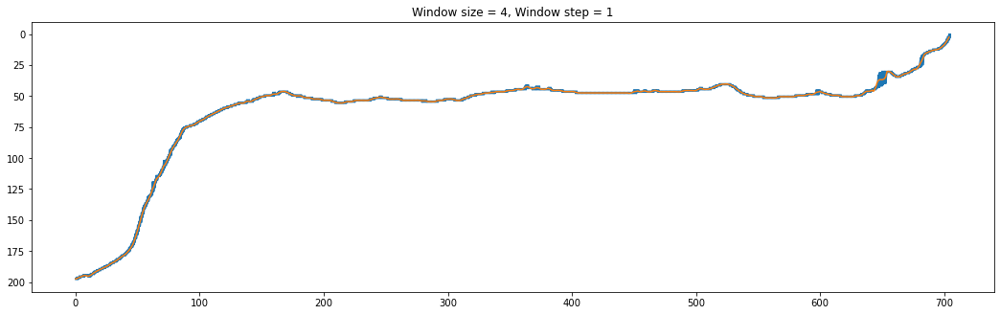

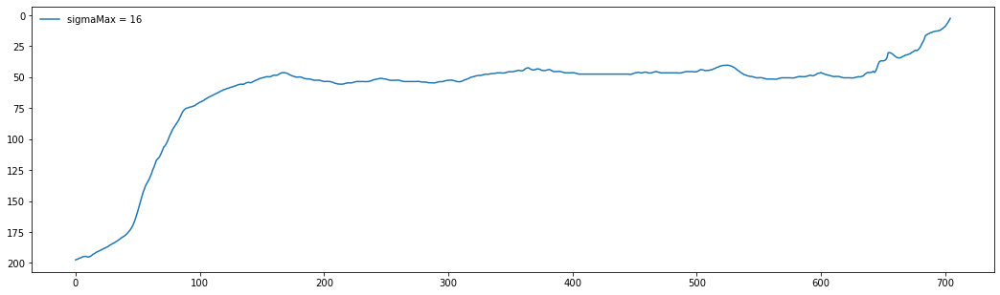

In [7]:
#################################### Step 3: Moving average ####################################
dataPoints_boundary_x=[]
dataPoints_boundary_y=[]
for x in dataPoints_boundary:
    dataPoints_boundary_x.append(x[0])
    dataPoints_boundary_y.append(x[1])

dataPoints_boundary_x = dataPoints_boundary_x - dataPoints_boundary_x[0] 

numberOfSteps_sigmaMax_4 = max(dataPoints_boundary_x)/windowStep
numberOfSteps_sigmaMax_4 = np.arange(numberOfSteps_sigmaMax_4)

def movingAverage(dataPoints_boundary_x, dataPoints_boundary_y, windowSize, windowStep):
    numberOfSteps = max(dataPoints_boundary_x)/windowStep
    numberOfSteps = numberOfSteps.astype(np.int64)
    slope=[]
    intercept=[]
    for i in range(numberOfSteps):
        a=[]
        b=[]
        for x, y in zip(dataPoints_boundary_x, dataPoints_boundary_y):
            if 0+i*windowStep <= x <= windowSize+i*windowStep:
                a.append(x)
                b.append(y)
        m, b = np.polyfit(a, b, 1)
        slope.append(m)
        intercept.append(b)
    return slope, intercept

slope_sigmaMax_4, intercept_sigmaMax_4 = movingAverage(dataPoints_boundary_x, dataPoints_boundary_y, windowSize, windowStep)

a_sigmaMax_4 = slope_sigmaMax_4*numberOfSteps_sigmaMax_4 + intercept_sigmaMax_4

### Plot
plt.figure(figsize=(18, 8))
plt.title('Window size = %d, Window step = %d' % (windowSize, windowStep))
plt.plot(dataPoints_boundary_x,dataPoints_boundary_y, label="True boundary")
plt.plot(numberOfSteps_sigmaMax_4, a_sigmaMax_4, label="Fitted boundary")
plt.gca().invert_yaxis()                                 ### Reverse the y axis
plt.gca().set_aspect('equal', adjustable='box')          ### Equalize the x and y axes scale
fig.tight_layout()

coordinates_sigmaMax_4_windowSize_3_x = []
coordinates_sigmaMax_4_windowSize_3_y = []

for x, y in zip(numberOfSteps_sigmaMax_4, a_sigmaMax_4):
    coordinates_sigmaMax_4_windowSize_3_x.append(x)
    coordinates_sigmaMax_4_windowSize_3_y.append(y)

plt.figure(figsize=(18, 8))
plt.plot(coordinates_sigmaMax_4_windowSize_3_x, coordinates_sigmaMax_4_windowSize_3_y, label="sigmaMax = 16")
plt.legend(frameon=False)
plt.gca().invert_yaxis()                                 ### Reverse the y axis
plt.gca().set_aspect('equal', adjustable='box')          ### Equalize the x and y axes scale
fig.tight_layout()

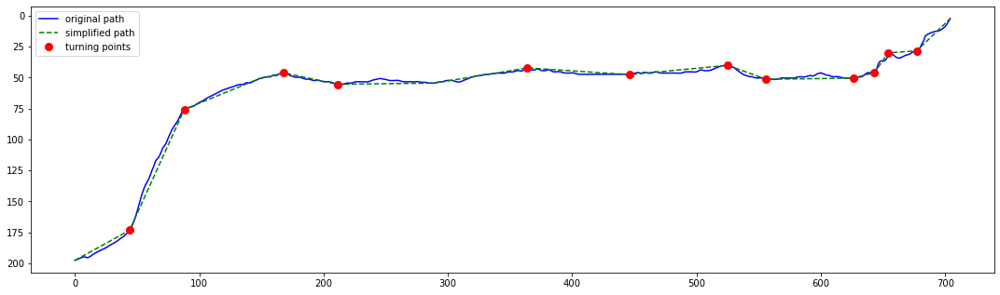

In [8]:
#################################### Step 4: Ramer-Douglas-Peucker smoothing ####################################
def angle(dir):
    """
    Returns the angles between vectors.

    Parameters:
    dir is a 2D-array of shape (N,M) representing N vectors in M-dimensional space.

    The return value is a 1D-array of values of shape (N-1,), with each value
    between 0 and pi.

    0 implies the vectors point in the same direction
    pi/2 implies the vectors are orthogonal
    pi implies the vectors point in opposite directions
    """
    dir2 = dir[1:]
    dir1 = dir[:-1]
    return np.arccos((dir1*dir2).sum(axis=1)/(np.sqrt((dir1**2).sum(axis=1)*(dir2**2).sum(axis=1))))

tolerance = tolerance
min_angle = np.pi*angle_coeff

x, y = coordinates_sigmaMax_4_windowSize_3_x, coordinates_sigmaMax_4_windowSize_3_y
points = []
for i, j in zip(x ,y):
    points.append([i,j])

# Use the Ramer-Douglas-Peucker algorithm to simplify the path
simplified = np.array(rdp.rdp(points, tolerance))
sx, sy = simplified.T

# compute the direction vectors on the simplified curve
directions = np.diff(simplified, axis=0)
theta = angle(directions)
# Select the index of the points with the greatest theta
# Large theta is associated with greatest change in direction.
idx = np.where(theta>min_angle)[0]+1

fig = plt.figure(figsize=(18, 8))
fig.set_size_inches(18.5, 10.5)
ax =fig.add_subplot(111)
ax.plot(x, y, 'b-', label='original path')
ax.plot(sx, sy, 'g--', label='simplified path')
ax.plot(sx[idx], sy[idx], 'ro', markersize = 8, label='turning points')
ax.invert_yaxis()
plt.gca().set_aspect('equal', adjustable='box')          ### Equalize the x and y axes scale
plt.legend(loc='best')
plt.show()

In [9]:
#################################### Step 5: Localization quantification ####################################
### Calculate the angle 
### Add the first and last data points
aa = sx[idx].tolist()   ### covert to a list
bb = sy[idx].tolist()   ### covert to a list
aa.insert(0,x[0])
aa.insert(len(aa),x[-1])
bb.insert(0,y[0])
bb.insert(len(bb),y[-1])

def vector(x, y):
    a = np.diff(x)
    b = np.diff(y)
    list_vector = []
    for i, j in zip(a, b):
        list_vector.append([i,j])
    return list_vector

vector = vector(aa,bb)

def dotproduct(v1, v2):
    return sum((a*b) for a, b in zip(v1, v2))
def length(v):
    return math.sqrt(dotproduct(v, v))
def angle_degree(v1, v2):
    return math.acos(dotproduct(v1, v2) / (length(v1) * length(v2)))*180/np.pi

list_angle_atan = []
for i in vector:
    angle = math.atan2(i[0],i[1]) * 180 / np.pi - 90
    list_angle_atan.append(angle)

### Determine the types of shear features and quantify the amount of it
projected_length_total = abs(aa[-1]-aa[0])
projected_length_segment = np.diff(aa)

index_homo=[]
index_Y=[]
index_R1=[]
index_R2=[]

for x in range(len(list_angle_atan)):
    if list_angle_atan[x] > 5:
        index_homo.append(x)
    if -5 < list_angle_atan[x] <= 5:
        index_Y.append(x)
    if -35 <= list_angle_atan[x] <= -5:
        index_R1.append(x)
    if -80 <= list_angle_atan[x] <= -70:
        index_R2.append(x)

projected_length_homo=[]      
projected_length_Y=[]
projected_length_R1=[]
projected_length_R2=[]

for i in index_homo:
    projected_length_homo.append(projected_length_segment[i])
for i in index_Y:
    projected_length_Y.append(projected_length_segment[i])    
for i in index_R1:
    projected_length_R1.append(projected_length_segment[i])    
for i in index_R2:
    projected_length_R2.append(projected_length_segment[i])    

homo = sum(projected_length_homo)
Y = sum(projected_length_Y)
R1 = sum(projected_length_R1)
R2 = sum(projected_length_R2)
    
print(projected_length_total)
print(homo)
print(Y)
print(R1)
print(R2)

list_total=[]
list_total.append([projected_length_total,homo,Y,R1,R2])

704.0
302.0
328.0
74.0
0


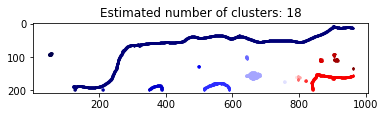

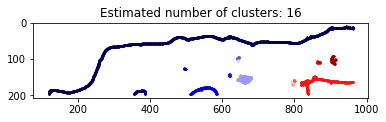

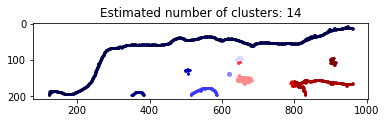

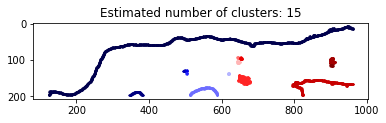

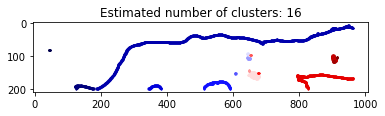

...

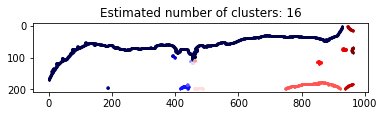

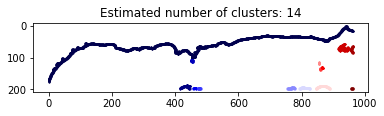

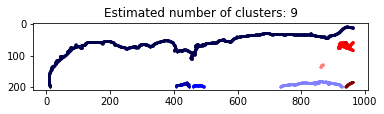

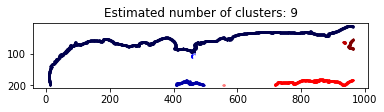

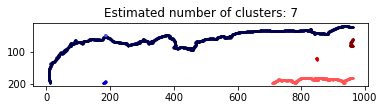

In [25]:
### Once the results of the first five images of the manual and automatic methods are consistent, we then applied identical trainable segmentation conditions to the rest of the images and run the same procedure ###

### Read the rest of XCT images ###
img = [cv2.imread(file) for file in glob.glob('images folder directory')]

list_localization_total=[]

image_no = 1
for x_new in img:
    ###Classifier trained with fit_segmenter to segment other images ###
    features_new = features_func(x_new)
    result_new = future.predict_segmenter(features_new, clf)
    a = segmentation.mark_boundaries(x_new, result_new, color=(1,0,0), mode='thick')
    b = segmentation.find_boundaries(result_new, connectivity=100, mode='thick', background=0).astype(np.uint8)
    
    ### Extract coordinates of pixel vector points
    X=[]
    for x in range(len(b[1])):
        for y in range(len(b)):
            if b[y][x] == 1:
                X.append([x,y])
    X=np.array(X)

    ##### Clustering DBSCAN
    db = DBSCAN(eps=eps, min_samples=2).fit(X)          ### <-------------------Change value
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.seismic(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = X[class_member_mask & core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=2, markeredgewidth=0.0)

        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=20, markeredgewidth=0.0)
    
    ##### Obtain the data points in a certain cluster
    def ClusterIndicesNumpy(clustNum, labels_array): #numpy 
        return np.where(labels_array == clustNum)[0]

    list_label=[]
    for x in range(len(set(labels))):
        list_label.append(len(X[ClusterIndicesNumpy(x,db.labels_)]))
        a = list_label.index(max(list_label))

    dataPoints_boundary = X[ClusterIndicesNumpy(a, db.labels_)] ### <-------------------Change value

    ### Using moving average (or running average) with different window sizes and moving steps to determine 
    dataPoints_boundary = np.array(dataPoints_boundary)
    dataPoints_boundary_x=[]
    dataPoints_boundary_y=[]
    for x in dataPoints_boundary:
        dataPoints_boundary_x.append(x[0])
        dataPoints_boundary_y.append(x[1])

    dataPoints_boundary_x = dataPoints_boundary_x - dataPoints_boundary_x[0] 

    windowSize = windowSize
    windowStep = windowStep    
    numberOfSteps_sigmaMax_4 = max(dataPoints_boundary_x)/windowStep

    numberOfSteps_sigmaMax_4 = np.arange(numberOfSteps_sigmaMax_4)

    def movingAverage(dataPoints_boundary_x, dataPoints_boundary_y, windowSize, windowStep):
        numberOfSteps = max(dataPoints_boundary_x)/windowStep
        numberOfSteps = numberOfSteps.astype(np.int64)
        slope=[]
        intercept=[]
        for i in range(numberOfSteps):
            a=[]
            b=[]
            for x, y in zip(dataPoints_boundary_x, dataPoints_boundary_y):
                if 0+i*windowStep <= x <= windowSize+i*windowStep:
                    a.append(x)
                    b.append(y)
            m, b = np.polyfit(a, b, 1)
            slope.append(m)
            intercept.append(b)
        return slope, intercept

    slope_sigmaMax_4, intercept_sigmaMax_4 = movingAverage(dataPoints_boundary_x, dataPoints_boundary_y, windowSize, windowStep)

    a_sigmaMax_4 = slope_sigmaMax_4*numberOfSteps_sigmaMax_4 + intercept_sigmaMax_4

    coordinates_sigmaMax_4_windowSize_3_x = []
    coordinates_sigmaMax_4_windowSize_3_y = []

    for x, y in zip(numberOfSteps_sigmaMax_4, a_sigmaMax_4):
        coordinates_sigmaMax_4_windowSize_3_x.append(x)
        coordinates_sigmaMax_4_windowSize_3_y.append(y)

    def angle(dir):
        dir2 = dir[1:]
        dir1 = dir[:-1]
        return np.arccos((dir1*dir2).sum(axis=1)/(np.sqrt((dir1**2).sum(axis=1)*(dir2**2).sum(axis=1))))

    tolerance = tolerance
    min_angle = np.pi*angle_coeff

    x, y = coordinates_sigmaMax_4_windowSize_3_x, coordinates_sigmaMax_4_windowSize_3_y
    points = []
    for i, j in zip(x ,y):
        points.append([i,j])

    # Use the Ramer-Douglas-Peucker algorithm to simplify the path
    simplified = np.array(rdp.rdp(points, tolerance))
    sx, sy = simplified.T

    # compute the direction vectors on the simplified curve
    directions = np.diff(simplified, axis=0)
    theta = angle(directions)
    # Select the index of the points with the greatest theta
    # Large theta is associated with greatest change in direction.
    idx = np.where(theta>min_angle)[0]+1

    ### Calculate the angle 
    ### Add the first and last data points
    aa = sx[idx].tolist()   ### covert to a list
    bb = sy[idx].tolist()   ### covert to a list
    aa.insert(0,x[0])
    aa.insert(len(aa),x[-1])
    bb.insert(0,y[0])
    bb.insert(len(bb),y[-1])

    def vector(x, y):
        a = np.diff(x)
        b = np.diff(y)
        list_vector = []
        for i, j in zip(a, b):
            list_vector.append([i,j])
        return list_vector

    vector = vector(aa,bb)

    def dotproduct(v1, v2):
        return sum((a*b) for a, b in zip(v1, v2))
    def length(v):
        return math.sqrt(dotproduct(v, v))
    def angle_degree(v1, v2):
        return math.acos(dotproduct(v1, v2) / (length(v1) * length(v2)))*180/np.pi

    list_angle_atan = []
    for i in vector:
        angle = math.atan2(i[0],i[1]) * 180 / np.pi - 90
        list_angle_atan.append(angle)

    ### Determine the types of shear features and quantify the amount of it
    projected_length_total = abs(aa[-1]-aa[0])
    projected_length_segment = np.diff(aa)

    index_homo=[]
    index_Y=[]
    index_R1=[]
    index_R2=[]
    #index_P=[]
    for x in range(len(list_angle_atan)):
        if list_angle_atan[x] > 5:
            index_homo.append(x)
        if -5 < list_angle_atan[x] <= 5:
            index_Y.append(x)
        if -40 <= list_angle_atan[x] <= -5:
            index_R1.append(x)
        if -80 <= list_angle_atan[x] <= -70:
            index_R2.append(x)

    projected_length_homo=[]      
    projected_length_Y=[]
    projected_length_R1=[]
    projected_length_R2=[]

    for i in index_homo:
        projected_length_homo.append(projected_length_segment[i])
    for i in index_Y:
        projected_length_Y.append(projected_length_segment[i])    
    for i in index_R1:
        projected_length_R1.append(projected_length_segment[i])    
    for i in index_R2:
        projected_length_R2.append(projected_length_segment[i])    

    homo = sum(projected_length_homo)
    Y = sum(projected_length_Y)
    R1 = sum(projected_length_R1)
    R2 = sum(projected_length_R2)

    list_localization_total.append([projected_length_total,homo,Y,R1,R2])   
    
    name = 'C:/Users/hung0016/Desktop/X-ray CT scan/s015_top_new220608/TIFF_000_output/img_' + str(image_no) + '.jpg'
    
    fig = plt.gcf()
    plt.title('Estimated number of clusters: %d' % n_clusters_)
    plt.gca().invert_yaxis()          ### Reverse the y axis
    plt.gca().set_aspect('equal', adjustable='box')          ### Equalize the x and y axes scale  
    plt.show()
    fig.savefig(name+'.png')
    image_no += 1
    
np.savetxt('s015_top_new220608_sigma_max_%d_tolerance_%d_total.txt' % (sigma_max, tolerance), list_localization_total)